In [28]:
#Importing required libraries
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from urllib.request import urlopen 

def url_to_image(url):
    resp = urlopen(url)
    image = np.asarray(bytearray(resp.read()), dtype="uint8")
    image = cv2.imdecode(image, cv2.IMREAD_COLOR)
    return image

In [29]:
image_links = [
    "https://scontent.xx.fbcdn.net/v/t1.15752-0/p180x540/158437160_240379114477751_4224753091836823568_n.jpg?_nc_cat=101&ccb=1-3&_nc_sid=f79d6e&_nc_ohc=GKh4DsQjXz8AX-gIzzr&_nc_ad=z-m&_nc_cid=0&_nc_ht=scontent.xx&tp=6&oh=f9aa960e5e4e3e4c2eddc02dfbb7e0d1&oe=606E060B",
    "https://cdn2.stylecraze.com/wp-content/uploads/2013/06/nanako-matsushima.jpg",
    "https://i.pinimg.com/564x/fc/48/af/fc48af3dc61155d0382f5d095694c585.jpg",
    "https://i.pinimg.com/originals/bf/17/05/bf170507466915c157bed4fbd6c59a78.jpg",
    "https://nypost.com/wp-content/uploads/sites/2/2020/12/yael-most-beautiful-video.jpg",
    "https://s.yimg.com/ny/api/res/1.2/6fh8dX7HxCqWj0fCxMIKfQ--/YXBwaWQ9aGlnaGxhbmRlcjtoPTY2Ng--/https://s.yimg.com/cd/resizer/2.0/original/-Q7ql8v_Hy83ubHz_N1KOxjFLbo",
    "https://i.pinimg.com/564x/57/14/96/571496d0e562669c7e3b39373cc3b4af.jpg"
]

In [30]:
images = []

for index, link in enumerate(image_links):
	# download the image URL and display it
	print("downloading (" + str(index) + ") : " + str(link))
	images.append(url_to_image(link))

downloading (0) : https://scontent.xx.fbcdn.net/v/t1.15752-0/p180x540/158437160_240379114477751_4224753091836823568_n.jpg?_nc_cat=101&ccb=1-3&_nc_sid=f79d6e&_nc_ohc=GKh4DsQjXz8AX-gIzzr&_nc_ad=z-m&_nc_cid=0&_nc_ht=scontent.xx&tp=6&oh=f9aa960e5e4e3e4c2eddc02dfbb7e0d1&oe=606E060B
downloading (1) : https://cdn2.stylecraze.com/wp-content/uploads/2013/06/nanako-matsushima.jpg
downloading (2) : https://i.pinimg.com/564x/fc/48/af/fc48af3dc61155d0382f5d095694c585.jpg
downloading (3) : https://i.pinimg.com/originals/bf/17/05/bf170507466915c157bed4fbd6c59a78.jpg
downloading (4) : https://nypost.com/wp-content/uploads/sites/2/2020/12/yael-most-beautiful-video.jpg
downloading (5) : https://s.yimg.com/ny/api/res/1.2/6fh8dX7HxCqWj0fCxMIKfQ--/YXBwaWQ9aGlnaGxhbmRlcjtoPTY2Ng--/https://s.yimg.com/cd/resizer/2.0/original/-Q7ql8v_Hy83ubHz_N1KOxjFLbo
downloading (6) : https://i.pinimg.com/564x/57/14/96/571496d0e562669c7e3b39373cc3b4af.jpg


0


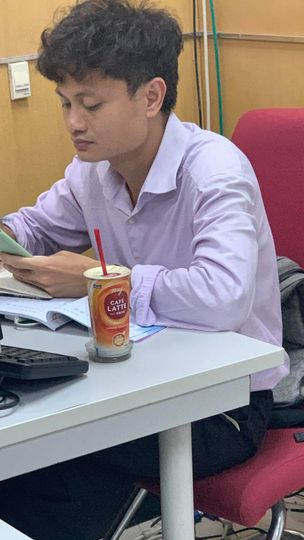

1


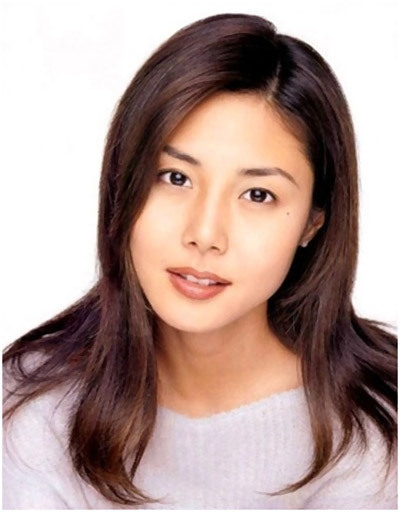

2


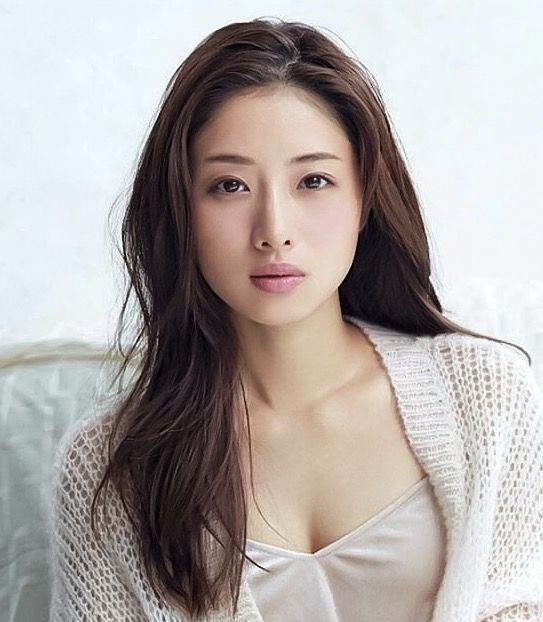

3


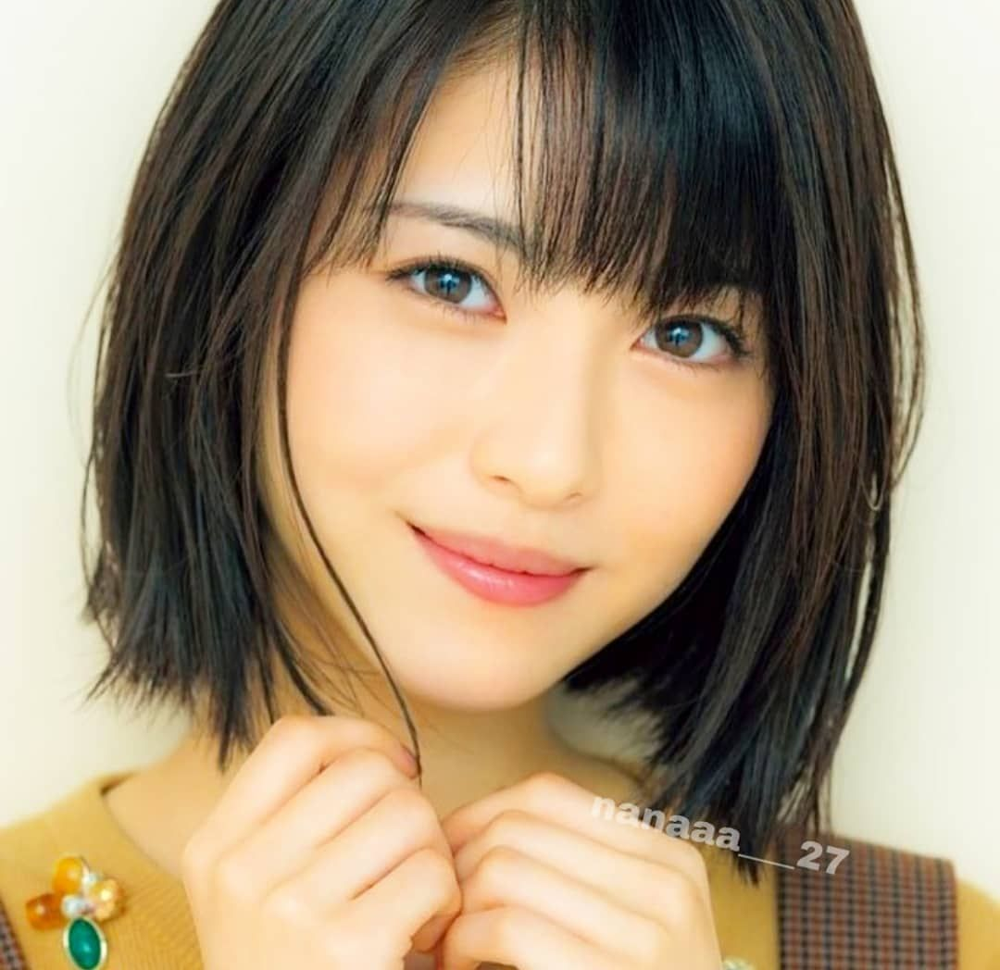

4


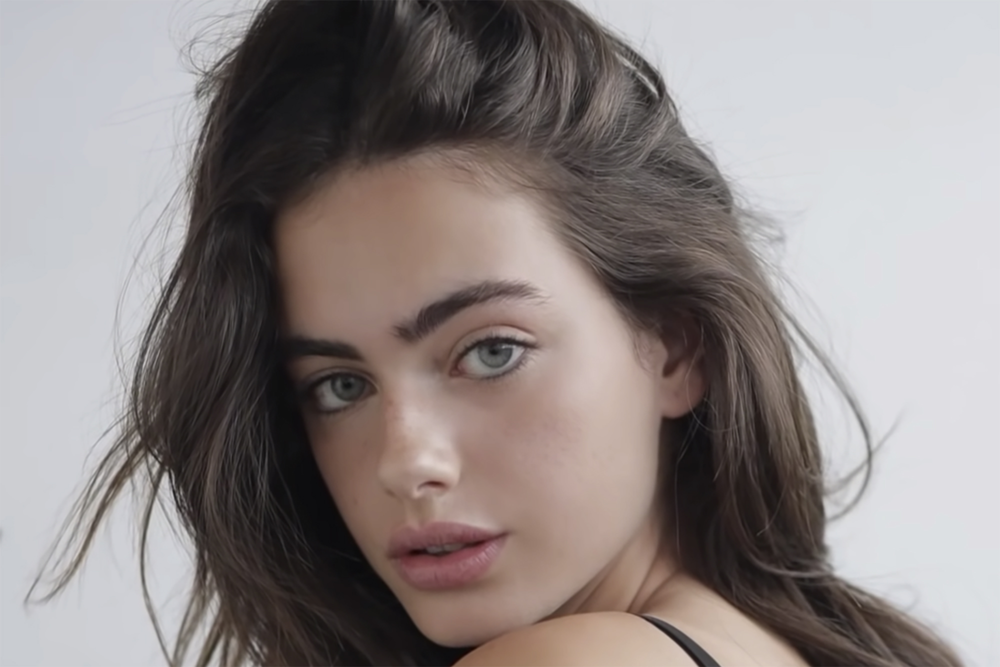

5


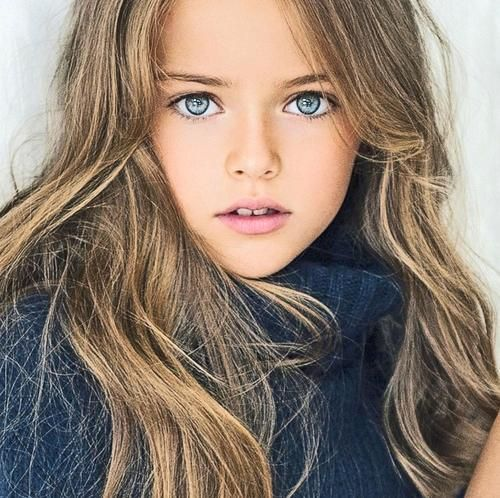

6


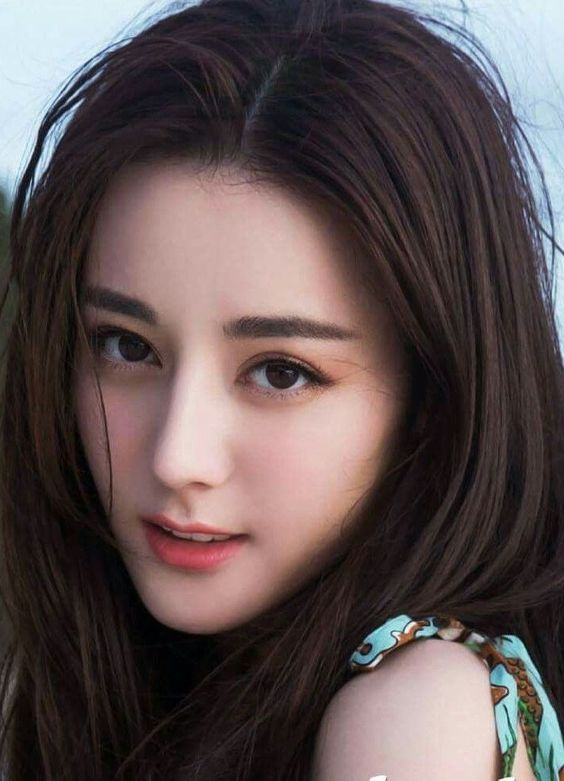

In [31]:
for index, img in enumerate(images):
    print(str(index))
    cv2_imshow(img)

In [32]:
def edge_detect(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = cv2.medianBlur(gray, 5)
    edges = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 9, 9)
    return edges

def cartoonize(img, edge):
    color = cv2.bilateralFilter(img, 9, 250, 250)
    cartoon = cv2.bitwise_and(color, color, mask=edge)
    return cartoon


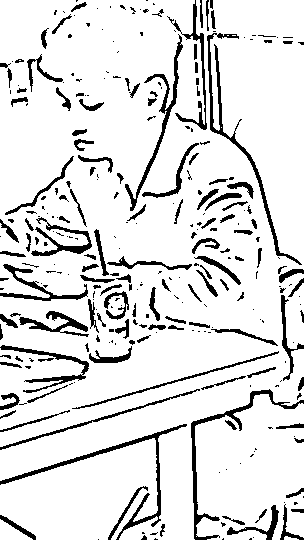

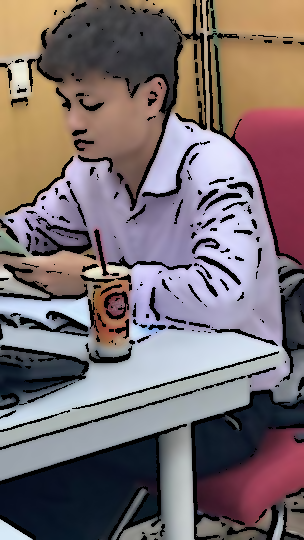

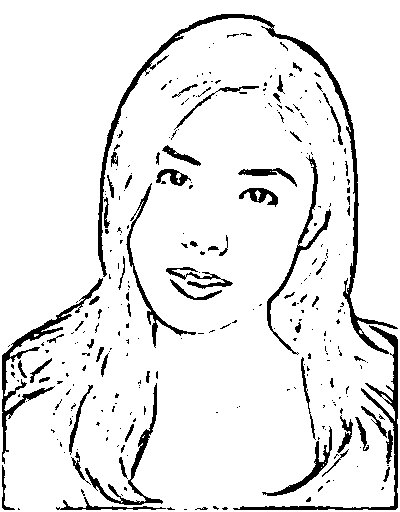

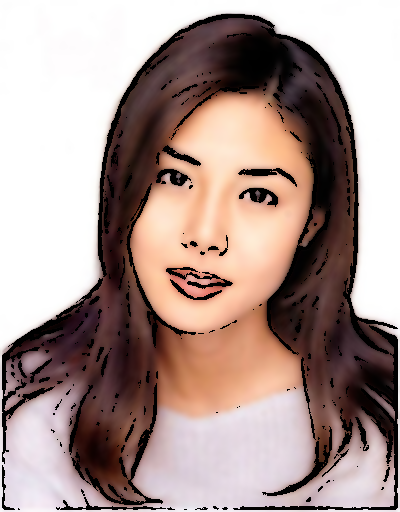

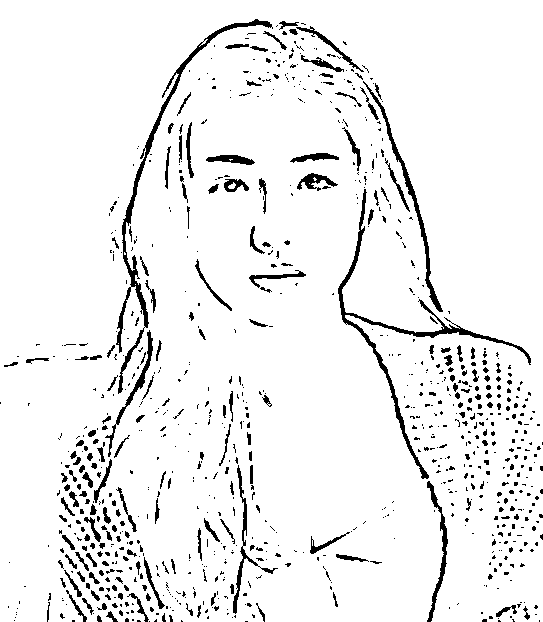

...

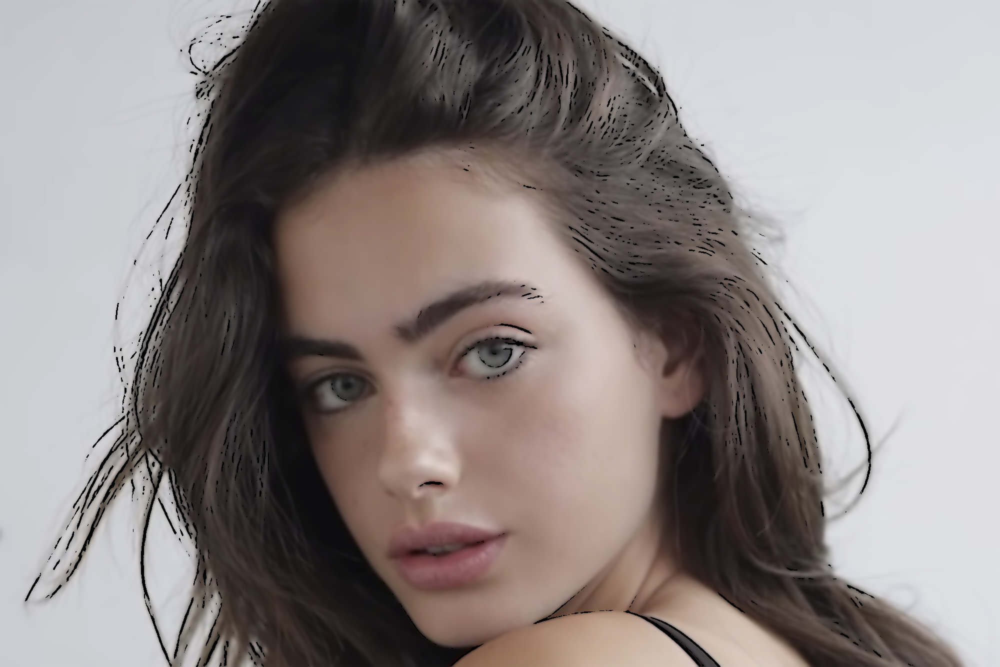

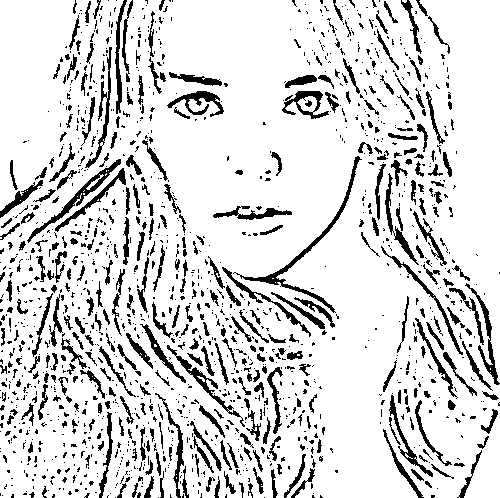

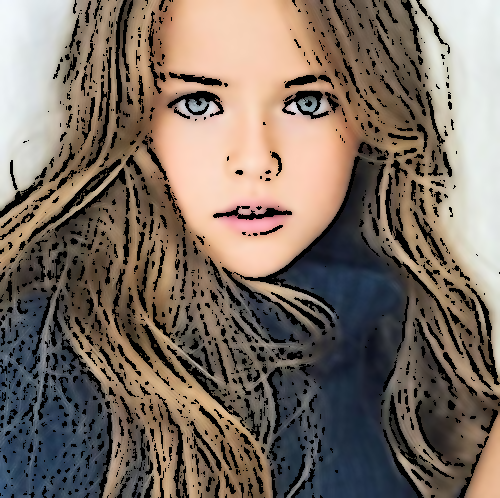

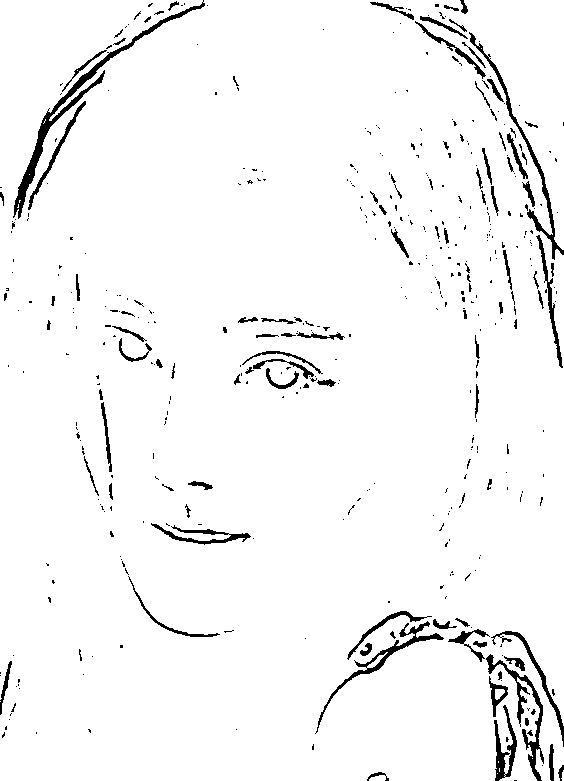

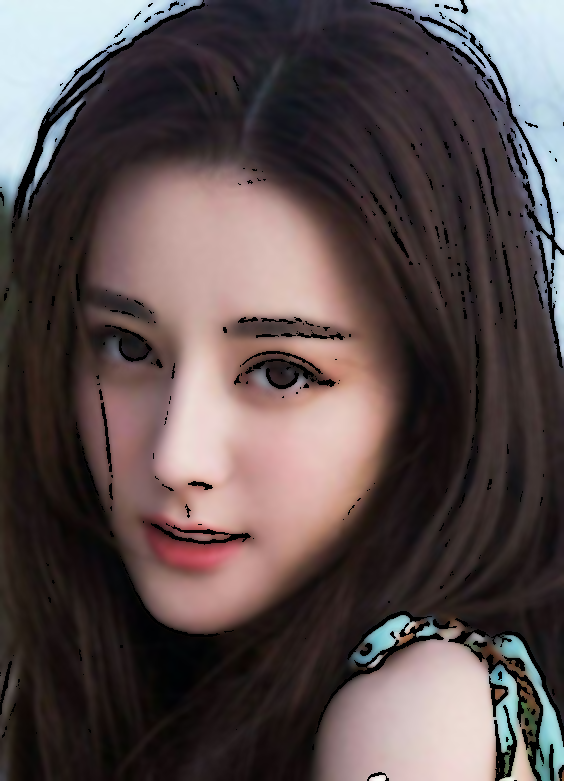

In [33]:
for img in images:
    edge = edge_detect(img)
    cartoon = cartoonize(img, edge)
    cv2_imshow(edge)
    cv2_imshow(cartoon)